<center><img src = "https://klgadgetguy.com/wp-content/uploads/2018/10/6ce1f4f6d79353c5f24ee047a5132d77.jpg" width = "750" height = "500"/></center>  

# The Goal of this Competition
Finding near-duplicates in large datasets is an important problem for many online businesses. Our task is to identify which products have been posted repeatedly. 

# Evaluation Criteria
Submissions will be evaluated based on their mean F1 score. The mean is calculated in a sample-wise fashion, meaning that an [F1 score](https://deepai.org/machine-learning-glossary-and-terms/f-score) is calculated for every predicted row, then averaged.

<h2 style='color:white; background:#000080; border:0'><center>Overview</center></h2>

What is Shopee ?
[Wikipedia page](https://en.wikipedia.org/wiki/Shopee) says that Shopee Pte Ltd (/ʃɒpiː/ SHO-pee) is a Singaporean multinational technology company which focuses mainly on e-commerce. Headquartered under Sea Group (previously known as Garena),[2] Shopee was first launched in Singapore in 2015, and later expanded its reach to Malaysia, Thailand, Taiwan, Indonesia, Vietnam, the Philippines and Brazil.

[The competition page](https://www.kaggle.com/c/shopee-product-matching/data) states that Shopee is the leading e-commerce platform in Southeast Asia and Taiwan. Customers appreciate its easy, secure, and fast online shopping experience tailored to their region. The company also provides strong payment and logistical support along with a 'Lowest Price Guaranteed' feature on thousands of Shopee's listed products.

[The competition page](https://www.kaggle.com/c/shopee-product-matching/data) states the following about each ID.
Files
[train/test].csv - the training set metadata. Each row contains the data for a single posting. Multiple postings might have the exact same image ID, but with different titles or vice versa.

* posting_id - the ID code for the posting.

* image - the image id/md5sum.

* image_phash - a perceptual hash of the image.

* title - the product description for the posting.

* label_group - ID code for all postings that map to the same product. Not provided for the test set.

* [train/test]images - the images associated with the postings.

* sample_submission.csv - a sample submission file in the correct format.

* posting_id - the ID code for the posting.

* matches - Space delimited list of all posting IDs that match this posting. Posts always self-match. Group sizes were capped at 50, so there's no need to predict more than 50 matches.

In [1]:
pip install textfeatures

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install nltk

Note: you may need to restart the kernel to use updated packages.


In [3]:
import nltk

* NLTK (Natural Language Toolkit) is useful for natural language processing. The official documentation is [here](http://www.nltk.org/).

In [4]:
import plotly.express as px

* Prepare a library to draw a histogram.

In [5]:
!pip install hvplot
import hvplot.pandas  # custom install

from glob import glob

from bq_helper import BigQueryHelper
from dask import bag, diagnostics 
from urllib import request

import missingno as msno

     |████████████████████████████████| 3.1 MB 1.1 MB/s 
     |████████████████████████████████| 428 kB 6.9 MB/s 
  Attempting uninstall: tornado
    Found existing installation: tornado 5.0.2
    Uninstalling tornado-5.0.2:
      Successfully uninstalled tornado-5.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jupyterlab-git 0.11.0 requires nbdime<2.0.0,>=1.1.0, but you have nbdime 2.1.0 which is incompatible.


In [6]:
import numpy as np
import pandas as pd
import os
import re
import pydicom
import matplotlib.pyplot as plt

# import useful tools
from glob import glob
from PIL import Image
import cv2
import pydicom as dcm
import random
import matplotlib.patches as patches
from sklearn.model_selection import KFold
from pydicom.pixel_data_handlers.util import apply_voi_lut

from sklearn.model_selection import StratifiedKFold
import warnings

import plotly.express as px
from wordcloud import WordCloud, STOPWORDS

# Work with phash
import imagehash

# import data visualization
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
import matplotlib
import pydicom as dicom

from bokeh.plotting import figure
from bokeh.io import output_notebook, show, output_file
from bokeh.models import ColumnDataSource, HoverTool, Panel
from bokeh.models.widgets import Tabs
import skimage.io as io

# import data augmentation
import albumentations as albu

# import math module
import math

# Libraries
import pandas_profiling
import xgboost as xgb
from sklearn.metrics import log_loss
from sklearn.preprocessing import LabelEncoder
from sklearn import preprocessing
from sklearn.model_selection import KFold
from sklearn.tree import DecisionTreeRegressor
import matplotlib.patches as patches
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff

import tqdm
from tqdm.auto import tqdm as tqdmp
tqdmp.pandas()

# One-hot encoding
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor

# Other
from random import randint
import warnings
import csv
warnings.filterwarnings("ignore")

In [7]:
# Color scheme
colors = ["#EDAC54", "#F4C5B7", "#DD7555", "#B95F18", "#000080"]

<h2 style='color:white; background:#000080; border:0'><center>Usefull functuions</center></h2>

In [8]:
def plot_images(images_number):
    
    plot_list = train_df['image'].sample(n=images_number).tolist()
    size = np.sqrt(images_number)
    if int(size)*int(size) < images_number:
        size = int(size) + 1
        
    plt.figure(figsize=(10, 10))
    
    ind=0
    for image_id in plot_list:
        plt.subplot(size, size, ind + 1)
        image = cv2.imread(os.path.join('../input/shopee-product-matching/train_images/', image_id))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        plt.imshow(image)
        plt.title(image_id, fontsize=12)
        plt.axis("off")
        ind+=1
    plt.show()

<h2 style='color:white; background:#000080; border:0'><center>Loading data</center></h2>

In [9]:
# Setup the paths to train and test images

TEST_DIR = "../input/shopee-product-matching/test_images/"
TRAIN_DIR = "../input/shopee-product-matching/train_images/"
dataset_dir = "../input/shopee-product-matching/"

In [10]:
# Glob the directories and get the lists of train and test images
train_fns = glob(TRAIN_DIR + '*')
test_fns = glob(TEST_DIR + '*')

# Loading training data and test data
train_df = pd.read_csv(dataset_dir+'train.csv')
test = pd.read_csv(dataset_dir+'test.csv')
sample = pd.read_csv(dataset_dir+'sample_submission.csv')

In [11]:
train_images = dataset_dir + "/train_images/" + train_df['image']
train_df['path'] = train_images

test_images = dataset_dir + "/test_images/" + test['image']
test['path'] = test_images

<h2 style='color:white; background:#000080; border:0'><center>Statistics</center></h2>

In [12]:
# Let's find out how many images are under the directory
print('Train images: %d' %len(os.listdir(os.path.join(dataset_dir, "train_images"))))
print('Test images: %d' %len(os.listdir(os.path.join(dataset_dir, "test_images"))))

Train images: 32412
Test images: 3


Let's figure out the unique number for each columns.

In [13]:
train_df.head(5)

,posting_id,image,image_phash,title,label_group,path
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794,../input/shopee-product-matching//train_images...
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045,../input/shopee-product-matching//train_images...
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891,../input/shopee-product-matching//train_images...
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188,../input/shopee-product-matching//train_images...
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069,../input/shopee-product-matching//train_images...


In [14]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34250 entries, 0 to 34249
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   posting_id   34250 non-null  object
 1   image        34250 non-null  object
 2   image_phash  34250 non-null  object
 3   title        34250 non-null  object
 4   label_group  34250 non-null  int64 
 5   path         34250 non-null  object
dtypes: int64(1), object(5)
memory usage: 1.6+ MB


In [15]:
train_df.nunique().to_frame().rename(columns={0:"Unique Values"}).style.background_gradient(cmap="plasma")

,Unique Values
posting_id,34250
image,32412
image_phash,28735
title,33117
label_group,11014
path,32412


* The number of uniqueness is the same for image and path. image_phash and label_group are fewer in number than image, so there is a possibility to aggregate common images with these.

In [16]:
# Display of training data
print(train_df)

             posting_id                                 image  \
0       train_129225211  0000a68812bc7e98c42888dfb1c07da0.jpg   
1      train_3386243561  00039780dfc94d01db8676fe789ecd05.jpg   
2      train_2288590299  000a190fdd715a2a36faed16e2c65df7.jpg   
3      train_2406599165  00117e4fc239b1b641ff08340b429633.jpg   
4      train_3369186413  00136d1cf4edede0203f32f05f660588.jpg   
...                 ...                                   ...   
34245  train_4028265689  fff1c07ceefc2c970a7964cfb81981c5.jpg   
34246   train_769054909  fff401691371bdcb382a0d9075dfea6a.jpg   
34247   train_614977732  fff421b78fa7284284724baf249f522e.jpg   
34248  train_3630949769  fff51b87916dbfb6d0f8faa01bee67b8.jpg   
34249  train_1792180725  ffffa0ab2ae542357671e96254fa7167.jpg   

            image_phash                                              title  \
0      94974f937d4c2433                          Paper Bag Victoria Secret   
1      af3f9460c2838f0f  Double Tape 3M VHB 12 mm x 4,5 m ORIGI

In [17]:
# Check for missing values in the training data
train_df.isnull().sum()

posting_id     0
image          0
image_phash    0
title          0
label_group    0
path           0
dtype: int64

* Fortunately, it turns out there are no missing values.

* Understanding same label_groups
* Counting the number of images in each label group

In [18]:
labels = train_df.groupby("label_group")["image"].count().reset_index()
labels.columns=["label_group","image_num"]
labels

,label_group,image_num
0,258047,3
1,297977,2
2,645628,12
3,801176,2
4,887886,2
...,...,...
11009,4292154092,2
11010,4292520070,11
11011,4292939171,2
11012,4293276364,2


In [19]:
sortlabels = labels.sort_values("image_num")
sortlabels

,label_group,image_num
3764,1471548468,2
8718,3381177724,2
4946,1934657835,2
8720,3381497963,2
4943,1932824351,2
...,...,...
2606,994676122,51
8037,3113678103,51
1445,562358068,51
9370,3627744656,51


* minimum images are 2, max images are 51

# Display Duplicated Items from Train Data
Using the column label_group which is the ground truth, we can display examples of duplicated items.

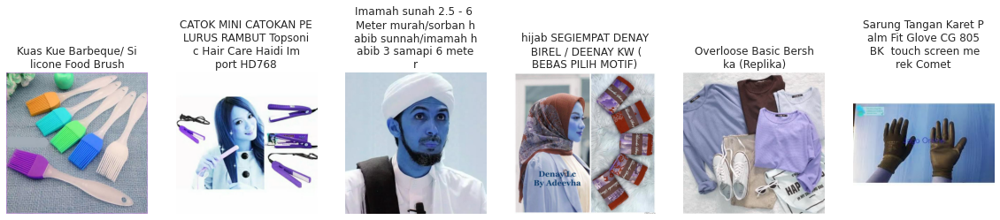

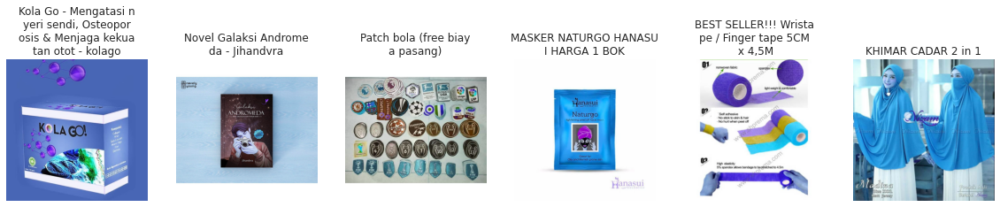

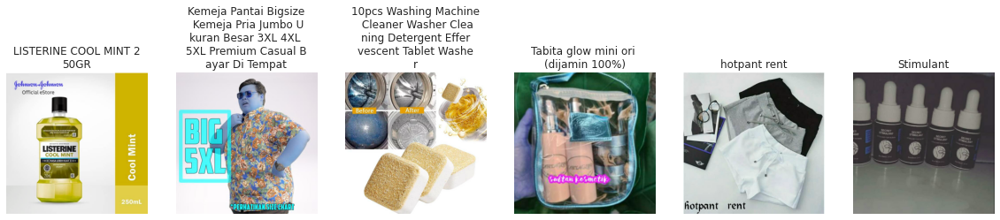

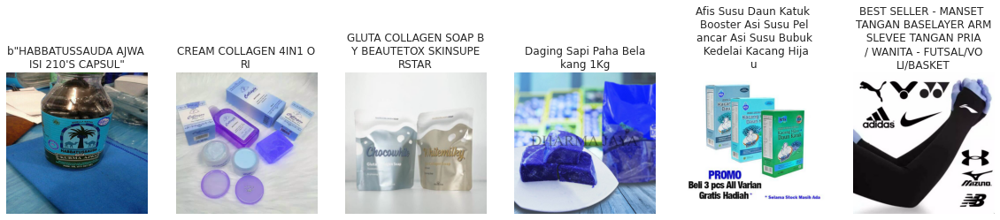

In [20]:
BASE = '../input/shopee-product-matching/train_images/'

def displayDF(train_df, random=False, COLS=6, ROWS=4, path=BASE):
    for k in range(ROWS):
        plt.figure(figsize=(20,5))
        for j in range(COLS):
            if random: row = np.random.randint(0,len(train_df))
            else: row = COLS*k + j
            name = train_df.iloc[row,1]
            title = train_df.iloc[row,3]
            title_with_return = ""
            for i,ch in enumerate(title):
                title_with_return += ch
                if (i!=0)&(i%20==0): title_with_return += '\n'
            img = cv2.imread(path+name)
            plt.subplot(1,COLS,j+1)
            plt.title(title_with_return)
            plt.axis('off')
            plt.imshow(img)
        plt.show()
        
displayDF(train_df,random=True)

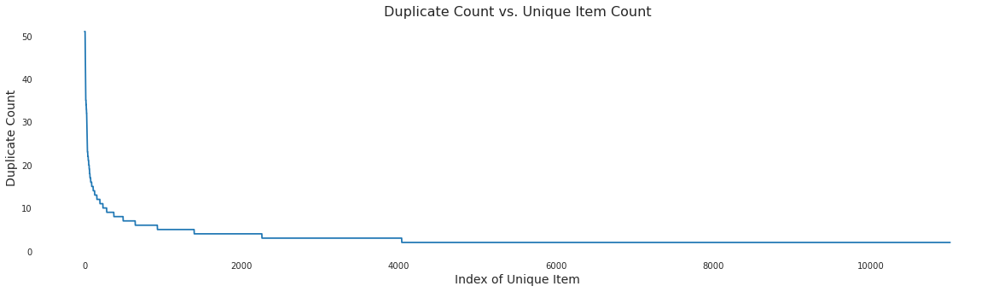

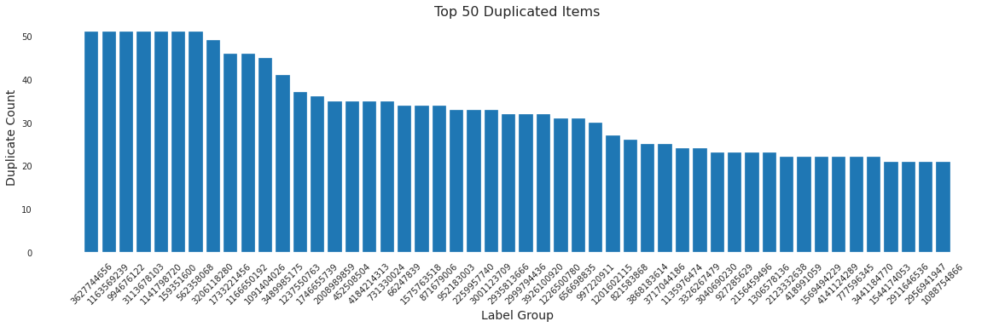

In [21]:
groups = train_df.label_group.value_counts()
plt.figure(figsize=(20,5))
plt.plot(np.arange(len(groups)),groups.values)
plt.ylabel('Duplicate Count',size=14)
plt.xlabel('Index of Unique Item',size=14)
plt.title('Duplicate Count vs. Unique Item Count',size=16)
plt.show()

plt.figure(figsize=(20,5))
plt.bar(groups.index.values[:50].astype('str'),groups.values[:50])
plt.xticks(rotation = 45)
plt.ylabel('Duplicate Count',size=14)
plt.xlabel('Label Group',size=14)
plt.title('Top 50 Duplicated Items',size=16)
plt.show()

########################################
### TOP 1 DUPLICATED ITEM: 3627744656
########################################


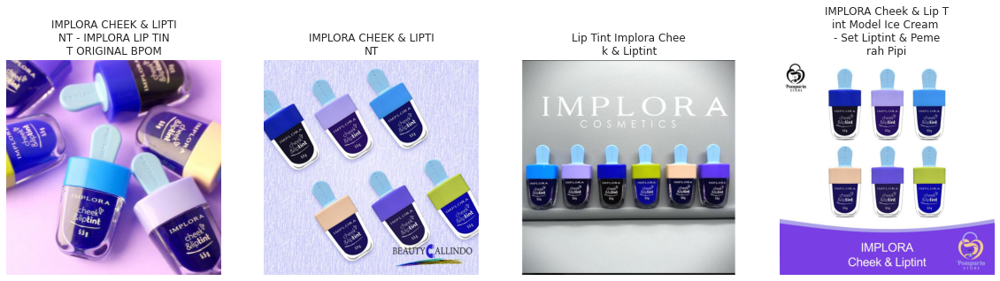

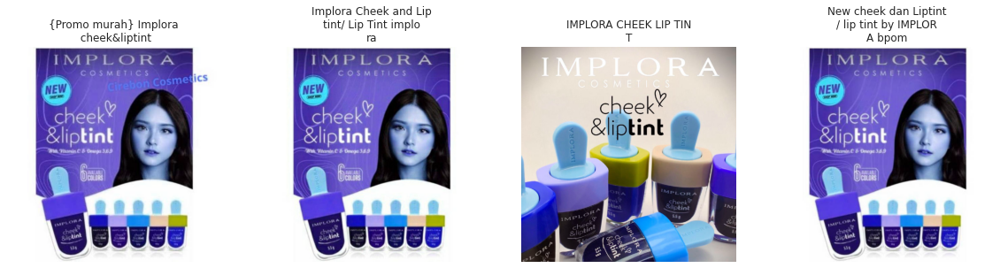

########################################
### TOP 2 DUPLICATED ITEM: 1163569239
########################################


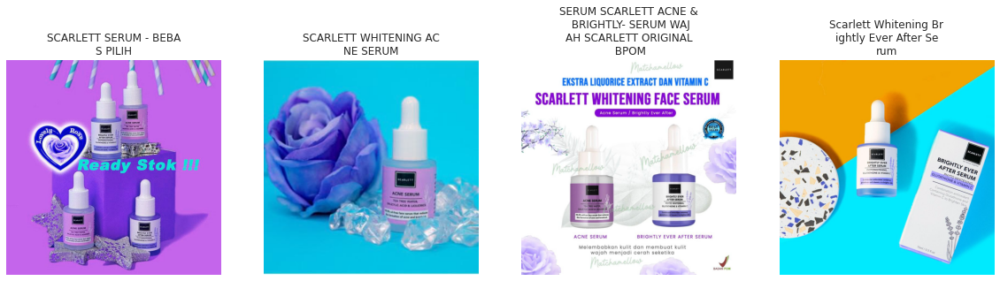

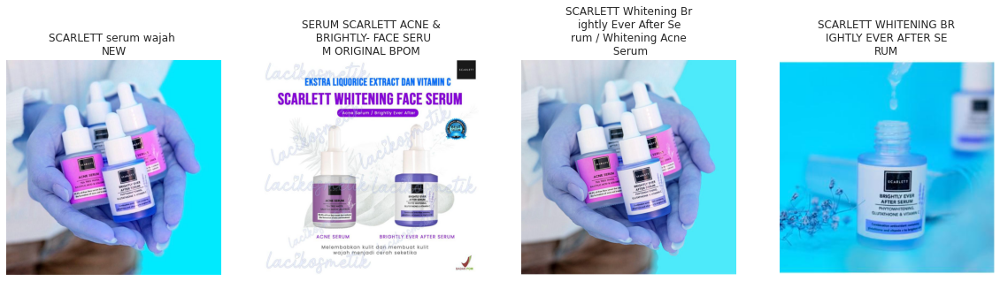

########################################
### TOP 3 DUPLICATED ITEM: 994676122
########################################


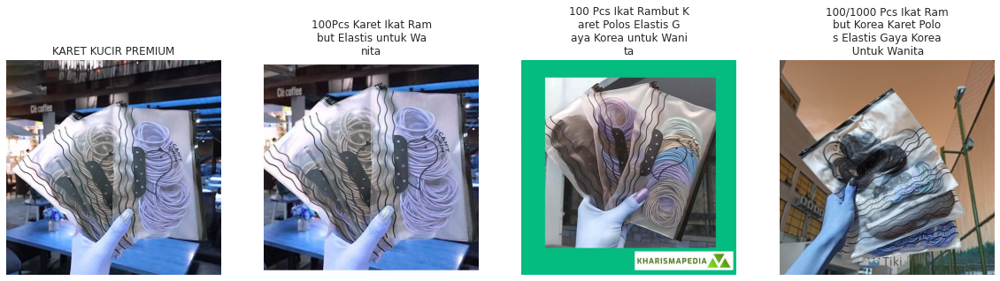

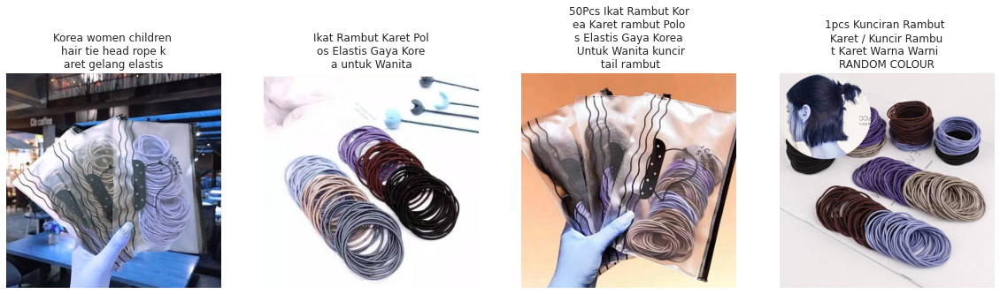

########################################
### TOP 4 DUPLICATED ITEM: 3113678103
########################################


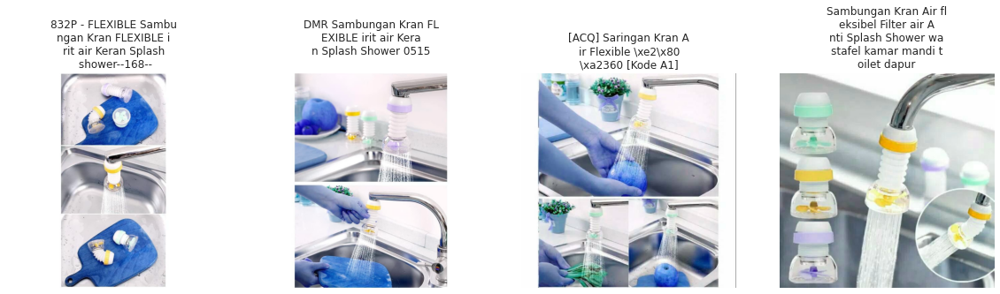

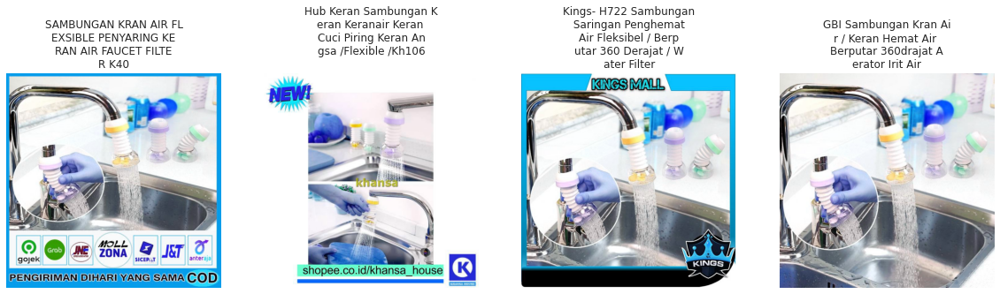

########################################
### TOP 5 DUPLICATED ITEM: 1141798720
########################################


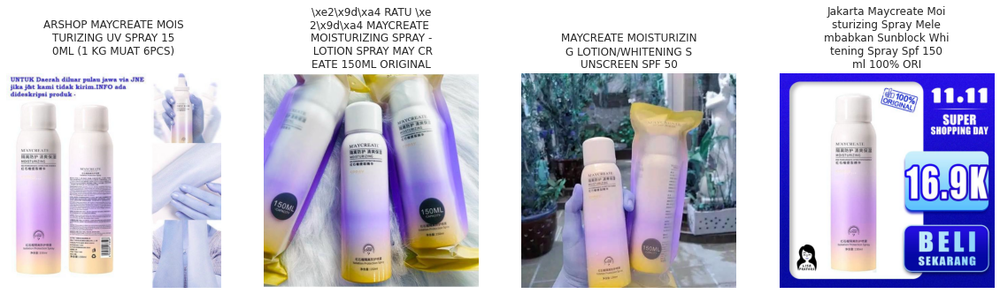

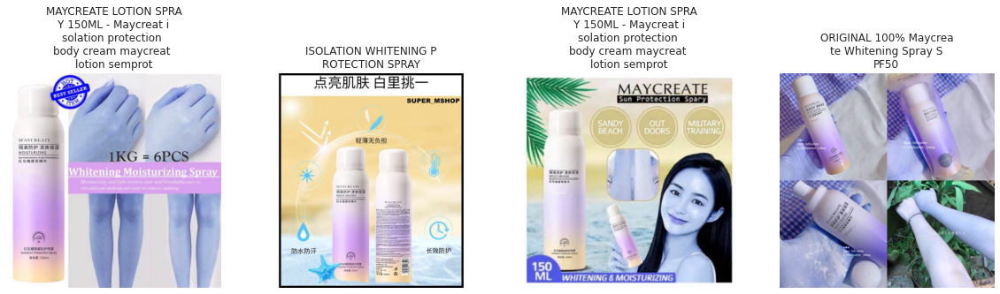

In [22]:
for k in range(5):
    print('#'*40)
    print('### TOP %i DUPLICATED ITEM:'%(k+1),groups.index[k])
    print('#'*40)
    top = train_df.loc[train_df.label_group==groups.index[k]]
    displayDF(top, random=False, ROWS=2, COLS=4)

# test

In [23]:
# Display of test data
print(test)

        posting_id                                 image       image_phash  \
0  test_2255846744  0006c8e5462ae52167402bac1c2e916e.jpg  ecc292392dc7687a   
1  test_3588702337  0007585c4d0f932859339129f709bfdc.jpg  e9968f60d2699e2c   
2  test_4015706929  0008377d3662e83ef44e1881af38b879.jpg  ba81c17e3581cabe   

                                               title  \
0  Edufuntoys - CHARACTER PHONE ada lampu dan mus...   
1  (Beli 1 Free Spatula) Masker Komedo | Blackhea...   
2   READY Lemonilo Mie instant sehat kuah dan goreng   

                                                path  
0  ../input/shopee-product-matching//test_images/...  
1  ../input/shopee-product-matching//test_images/...  
2  ../input/shopee-product-matching//test_images/...  


# sample

In [24]:
# Display of sample data
print(sample)

        posting_id          matches
0  test_2255846744  test_2255846744
1  test_3588702337  test_3588702337
2  test_4015706929  test_4015706929


[The competition page](https://www.kaggle.com/c/shopee-product-matching/data) states the following about the IDs of the submitted file.

* sample_submission.csv - a sample submission file in the correct format.

* posting_id - the ID code for the posting.

matches - Space delimited list of all posting IDs that match this posting. Posts always self-match. Group sizes were capped at 50, so there's no need to predict more than 50 matches.**

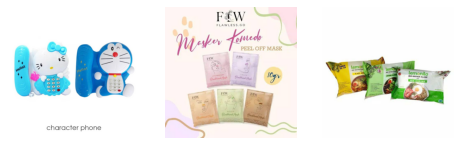

In [25]:
plt.figure(figsize=(8,8))

for num,a in enumerate(test["path"]):
    
    plt.subplot(1,3,num+1)
    img = cv2.imread(a)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.imshow(img)
    plt.axis("off")

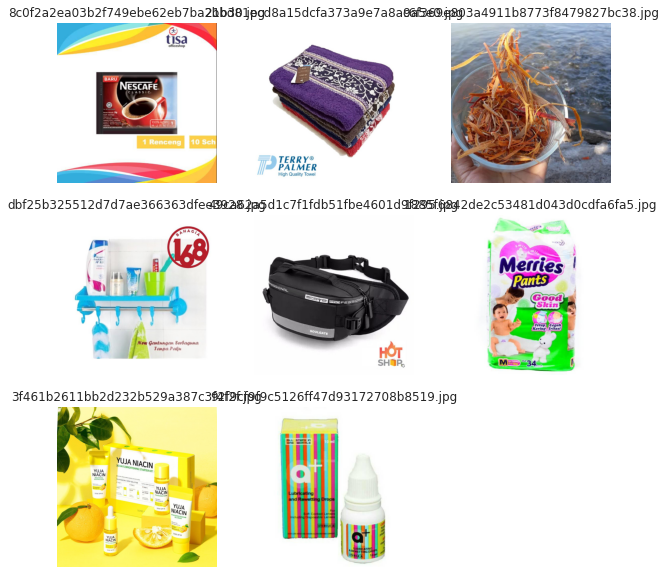

In [26]:
plot_images(8)

<h2 style='color:white; background:#000080; border:0'><center>Data Visualization</center></h2>

Image Label Groups by No. of Images

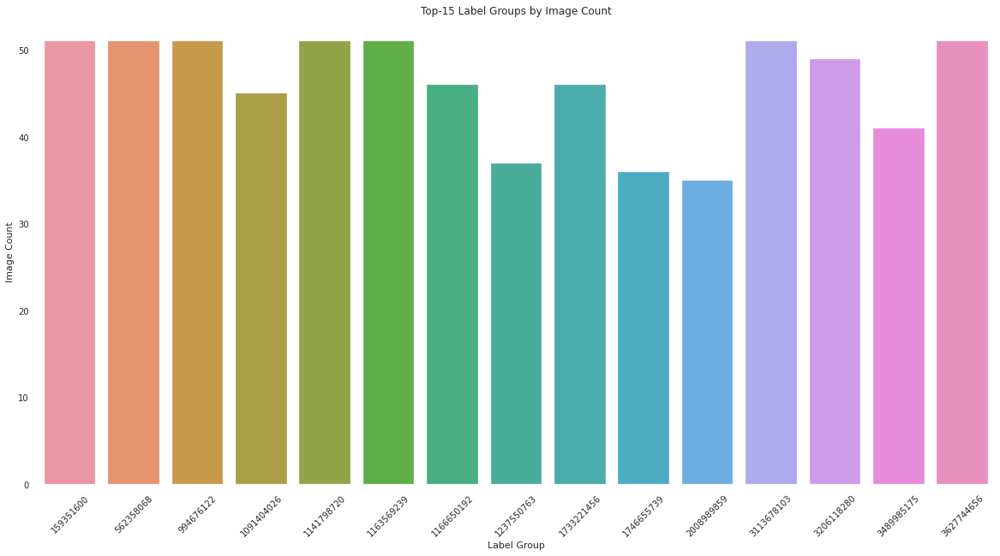

In [27]:
top10_names = train_df['label_group'].value_counts().index.tolist()[:15]
top10_values = train_df['label_group'].value_counts().tolist()[:15]

plt.figure(figsize=(20, 10))
sns.barplot(x=top10_names, y=top10_values)
plt.xticks(rotation=45)
plt.xlabel("Label Group")
plt.ylabel("Image Count")
plt.title("Top-15 Label Groups by Image Count")
plt.show()

* Take a look at the distribution of the number of images in Label Groups. There are some groups with a small number of images, but there are neither groups with a large number of images nor groups with a small number of images.

[](http://)<h2 style='color:white; background:#000080; border:0'><center>Titles analysis</center></h2>

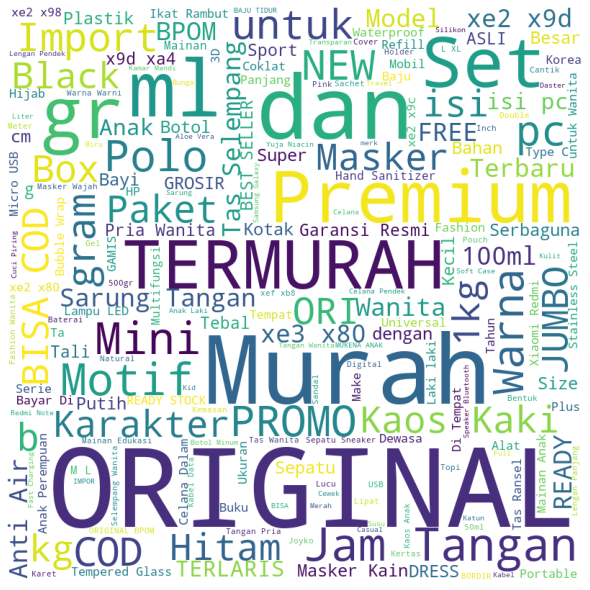

In [28]:
stopwords = set(STOPWORDS) 
wordcloud = WordCloud(width = 800, 
                      height = 800,
                      background_color ='white',
                      min_font_size = 10,
                      stopwords = stopwords,).generate(' '.join(train_df['title'])) 

# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 

plt.show() 

Basic NLP

In [29]:
def preprocess_text(text, flg_stemm=False, flg_lemm=True):

    lst_stopwords = nltk.corpus.stopwords.words("english")
    
    ## clean (convert to lowercase and remove punctuations and characters and then strip)
    text = re.sub(r'[^\w\s]', '', str(text).lower().strip())
            
    ## Tokenize (convert from string to list)
    lst_text = text.split()
    ## remove Stopwords
    if lst_stopwords is not None:
        lst_text = [word for word in lst_text if word not in 
                    lst_stopwords]
                
    ## Stemming (remove -ing, -ly, ...)
    if flg_stemm == True:
        ps = nltk.stem.porter.PorterStemmer()
        lst_text = [ps.stem(word) for word in lst_text]
                
    ## Lemmatisation (convert the word into root word)
    if flg_lemm == True:
        lem = nltk.stem.wordnet.WordNetLemmatizer()    
        lst_text = [lem.lemmatize(word) for word in lst_text]
            
    ## back to string from list
    text = " ".join(lst_text)
    return text

In [30]:
#Clean Address
train_df["clean_title"] = train_df["title"].apply(lambda x: preprocess_text(x, flg_stemm=False, flg_lemm=True, ))

In [31]:
#Length of Title
train_df['clean_title_len'] = train_df['clean_title'].apply(lambda x: len(x))

In [32]:
#Word Count
train_df['clean_title_word_count'] =train_df["clean_title"].apply(lambda x: len(str(x).split(" ")))

In [33]:
#Character Count
train_df['clean_title_char_count'] = train_df["clean_title"].apply(lambda x: sum(len(word) for word in str(x).split(" ")))

In [34]:
#Average Word Length
train_df['clean_title_avg_word_length'] = train_df['clean_title_char_count'] / train_df['clean_title_word_count']

In [35]:
def plot_distribution(x, title):

    fig = px.histogram(
    train_df, 
    x = x,
    width = 800,
    height = 500,
    title = title
    )
    
    fig.show()

In [36]:
plot_distribution(x = 'clean_title_len', title = 'Title Length Distribution')

In [37]:
plot_distribution(x = 'clean_title_word_count', title = 'Word Count Distribution')

In [38]:
plot_distribution(x = 'clean_title_char_count', title = 'Character Count Distribution')

In [39]:
plot_distribution(x = 'clean_title_avg_word_length', title = 'Average Word Length Distribution')

<h2 style='color:white; background:#000080; border:0'><center>Images analysis</center></h2>

In [40]:
phashgroup = train_df.groupby("image_phash")["path"].count().reset_index()
phashgroup.columns=["image_phash","counts"]
phashgroup

,image_phash,counts
0,80007f7f073f5f0a,1
1,8000dffdb58fdac0,1
2,80047f78993fb3b2,1
3,80157fb63f6a0c6a,1
4,80171a153f6bafca,1
...,...,...
28730,fff24181c2a2d5e4,4
28731,fff24181c6a2d564,1
28732,fff888845373a48c,1
28733,fffa9a21e144d094,1


In [41]:
sortphash = phashgroup.sort_values("counts")
sortphash

,image_phash,counts
0,80007f7f073f5f0a,1
18602,e1ca869ec6969a9a,1
18601,e1c9c3979e18c3c6,1
18600,e1c99a34cfcf3038,1
18599,e1c9966069c3b6d9,1
...,...,...
26257,f6d98134b904b56b,16
21189,e992966d4ba49761,16
12714,be12e12f9ec1e198,17
16476,d0c0ea37bd9acce0,20


* maximum counts are 26.

In [42]:
tmpdf = train_df[train_df["image_phash"]==sortphash["image_phash"].iloc[-1]]
tmpdf

,posting_id,image,image_phash,title,label_group,path,clean_title,clean_title_len,clean_title_word_count,clean_title_char_count,clean_title_avg_word_length
579,train_1015625393,04a00bccb7f1560e755f5f1def73db59.jpg,fad28daa2ad05595,Sugar Baby Organic Healthy Cot Sheet Perlak Bayi,997220911,../input/shopee-product-matching//train_images...,sugar baby organic healthy cot sheet perlak bayi,48,8,41,5.125000
1978,train_1942146514,0f459b1e8aa89ee9e79b2ec95440e9c3.jpg,fad28daa2ad05595,Perlak Karet Organic Bayi Sugar Baby uk 90x60 ...,997220911,../input/shopee-product-matching//train_images...,perlak karet organic bayi sugar baby uk 90x60 ...,73,14,60,4.285714
1979,train_1720530417,0f459b1e8aa89ee9e79b2ec95440e9c3.jpg,fad28daa2ad05595,Perlak Karet Organik Bayi Sugar Baby uk 90x60 ...,997220911,../input/shopee-product-matching//train_images...,perlak karet organik bayi sugar baby uk 90x60 ...,73,14,60,4.285714
3916,train_1062957964,1dbf735adb93d54e6340af02f9b5472e.jpg,fad28daa2ad05595,MURAH!! SUGAR BABY Perlak (Perlak Karet Waterp...,997220911,../input/shopee-product-matching//train_images...,murah sugar baby perlak perlak karet waterproo...,90,13,78,6.000000
3917,train_4124267548,1dbf735adb93d54e6340af02f9b5472e.jpg,fad28daa2ad05595,Sugar Baby Organic Healthy Cot Sheet - Perlak ...,997220911,../input/shopee-product-matching//train_images...,sugar baby organic healthy cot sheet perlak karet,49,8,42,5.250000
5919,train_4270145275,2cd540e8c1810d1d1aaf3d73b8116cdc.jpg,fad28daa2ad05595,Perlak Bayi Sugar Baby (Alas Ompol Waterproof ...,997220911,../input/shopee-product-matching//train_images...,perlak bayi sugar baby ala ompol waterproof un...,82,13,70,5.384615
8993,train_989190235,43af52158ed9acd8274a7d6d6c109dfc.jpg,fad28daa2ad05595,Perlak Waterproof Bayi SUGAR BABY 90 x 60 cm O...,997220911,../input/shopee-product-matching//train_images...,perlak waterproof bayi sugar baby 90 x 60 cm o...,68,12,57,4.750000
10768,train_3574291998,50ef370271e8c7e00eaaf018c9cd93dd.jpg,fad28daa2ad05595,Sugar Baby Pink Kitten Organic Healthy Cot She...,997220911,../input/shopee-product-matching//train_images...,sugar baby pink kitten organic healthy cot she...,79,15,65,4.333333
12248,train_1943986671,5c1e0f695fb5ab7b0d83de0fef4bfdaf.jpg,fad28daa2ad05595,Perlak Bayi organik SUGAR BABY / Perlak karet ...,997220911,../input/shopee-product-matching//train_images...,perlak bayi organik sugar baby perlak karet ba...,59,10,50,5.000000
17760,train_3141138577,8591ed8b5bc268e386a66206bb233b2f.jpg,fad28daa2ad05595,Perlak Sugar Baby 90x60cm,997220911,../input/shopee-product-matching//train_images...,perlak sugar baby 90x60cm,25,4,22,5.500000


In [43]:
# Shape columns
train_df['img_shape'] = train_df['path'].progress_apply(lambda x: np.shape(io.imread(x)))

  0%|          | 0/34250 [00:00<?, ?it/s]

* Draw the height, width, and color of the image as a scatter plot with histogram.

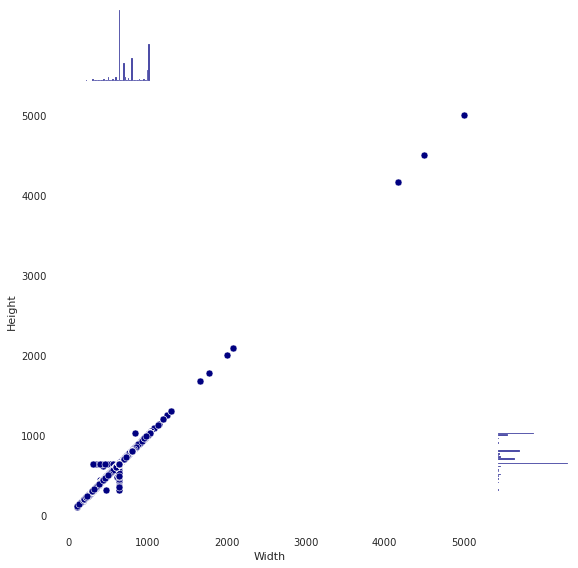

In [44]:
shapes = pd.DataFrame().from_records(train_df['img_shape'])
shapes.columns = ['Width', 'Height', 'Colors']

sns.set_style("white")
sns.jointplot(x = shapes.iloc[:, 0].astype('float32'), 
              y = shapes.iloc[:, 1].astype('float32'),
              height = 8, color = '#000080')
plt.show()

Duplicated Images

Total no. of images with duplicates: 1,246


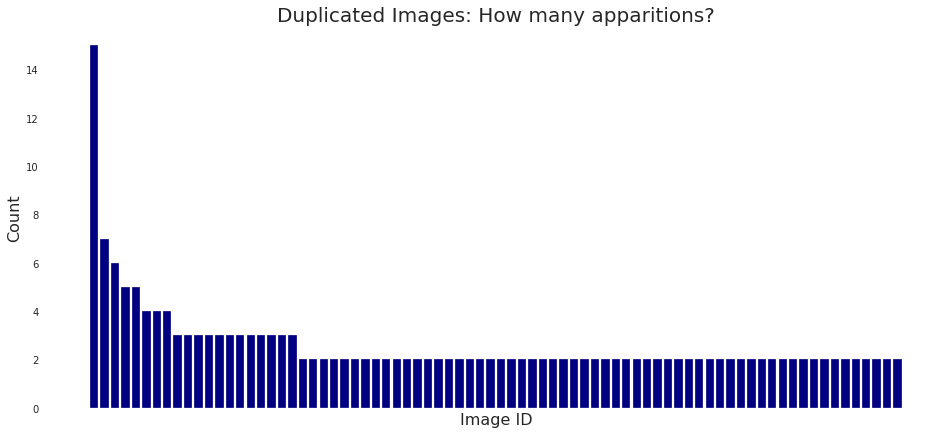

In [45]:
# Get the count of apparitions per image
image_count = train_df["image"].value_counts().reset_index()
image_count.columns = ["image", "count"]
image_count_duplicates = image_count[image_count["count"] > 1]
print("Total no. of images with duplicates: {:,}".format(len(image_count_duplicates)))

#Plot
fig, ax = plt.subplots(figsize=(16, 7))
plt.bar(x=image_count_duplicates.iloc[::16]["image"],
        height=image_count_duplicates.iloc[::16]["count"],
        color=colors[4])
plt.title("Duplicated Images: How many apparitions?", fontsize=20)
plt.xticks([])
plt.xlabel("Image ID", fontsize=16)
plt.ylabel("Count", fontsize=16);

* There are 1,246 images that have 2 or more apparitions
* the title differs for most of them
* the label_group differs for most of them as well

In [46]:
def image_viz(image_path):
    """
    Function for visualization.
    Takes path to image as input.
    """
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)    
    plt.imshow(img)
    plt.axis('off')

In [47]:
def match_matrix(phash_array):
    """
    A function that checks for matches by phash value.
    Takes phash values as input.
    Output - phash diff matrix (pandas data frame)
    """
    phashs = phash_array.apply(lambda x: imagehash.hex_to_hash(x))
    phash_matrix = pd.DataFrame()
    pbar = tqdm.tqdm(total = len(phash_array), desc = 'Progress:', 
                     position = 0, leave = True)
    for idx, i in enumerate(phash_array):
        pbar.update(1)
        phash_matrix = pd.concat([phash_matrix, phashs - imagehash.hex_to_hash(i)], 
                                 axis = 1)
    pbar.close()
    phash_matrix.columns = range(len(phash_array))
    return phash_matrix

* Check the fit by Phash value.

In [48]:
train_part = train_df.iloc[:1000, :]
matches = match_matrix(train_part['image_phash'])
matches

Progress:: 100%|██████████| 1000/1000 [00:13<00:00, 71.81it/s]


,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,0,42,40,30,32,34,32,30,38,36,...,26,28,34,32,26,28,42,34,26,26
1,42,0,28,28,34,32,36,24,28,32,...,32,28,30,28,42,32,30,32,32,34
2,40,28,0,34,44,26,34,32,28,32,...,34,42,30,30,32,36,24,32,30,24
3,30,28,34,0,34,40,30,32,34,30,...,28,34,38,32,38,28,38,28,30,30
4,32,34,44,34,0,32,30,30,36,30,...,36,22,28,32,26,24,36,34,32,36
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,28,32,36,28,24,32,34,30,36,38,...,34,28,26,26,32,0,34,32,30,32
996,42,30,24,38,36,24,32,30,34,36,...,24,36,28,36,40,34,0,26,34,26
997,34,32,32,28,34,32,30,28,38,30,...,34,32,38,34,30,32,26,0,34,32
998,26,32,30,30,32,36,40,36,30,30,...,34,36,36,32,26,30,34,34,0,28


In [49]:
test_match = match_matrix(test['image_phash'][:3])
test_match

Progress:: 100%|██████████| 3/3 [00:00<00:00, 515.36it/s]


,0,1,2
0,0,36,26
1,36,0,32
2,26,32,0


In [50]:
train_part.loc[[11,12],['title']]

,title
11,PASHMINA KUSUT RAWIS POLOS CRINKLE SHAWL MURAH...
12,PASHMINA KUSUT RAWIS POLOS CRINKLE SHAWL MURAH...


* Posting_id is different, but title, image_phash and label_group are the same image.

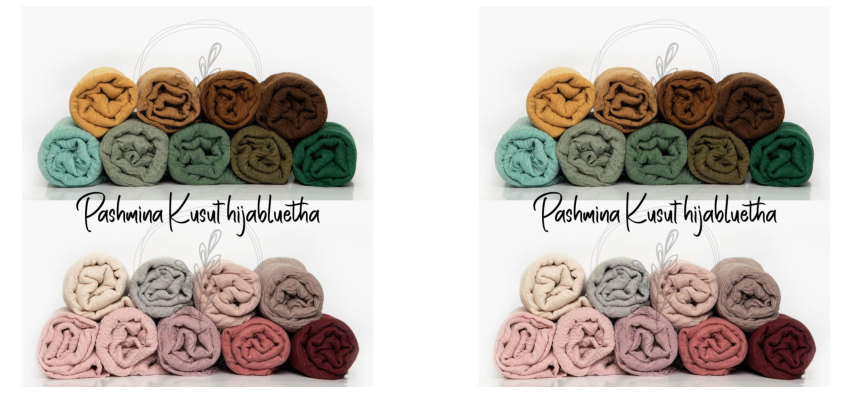

In [51]:
plt.figure(figsize = (15, 10))
for idx, i in enumerate([train_part.loc[11, 'path'], 
                         train_part.loc[12, 'path']]):
    plt.subplot(1, 2, idx + 1)
    image_viz(i)
plt.show()

In [52]:
train_part.loc[[889,890,891],['posting_id','image_phash','title','label_group']]

,posting_id,image_phash,title,label_group
889,train_1683455913,b6c8c835b1b66e0e,JUAL MUKENA ANAK /PUSAT GROSIR MUKENA ANAK DIS...,1662841908
890,train_38222465,b6c8c835b1b66e0e,MUKENA ANAK KATUN SUPER ADEM INCLUDE TAS RANS...,1662841908
891,train_3457647696,b6c8c835b1b66e0e,SALLE JUAL MUKENA ANAK KATUN DISNI TSUM ( TAS ...,1662841908


* Posting_id and title are different, but image_phash and label_group are the same image.

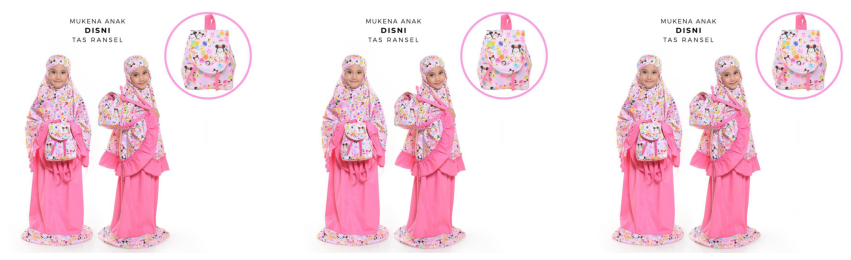

In [53]:
plt.figure(figsize = (15, 10))
for idx, i in enumerate([train_part.loc[889, 'path'], 
                         train_part.loc[890, 'path'], 
                         train_part.loc[891, 'path']]):
    plt.subplot(1, 3, idx + 1)
    image_viz(i)
plt.show()

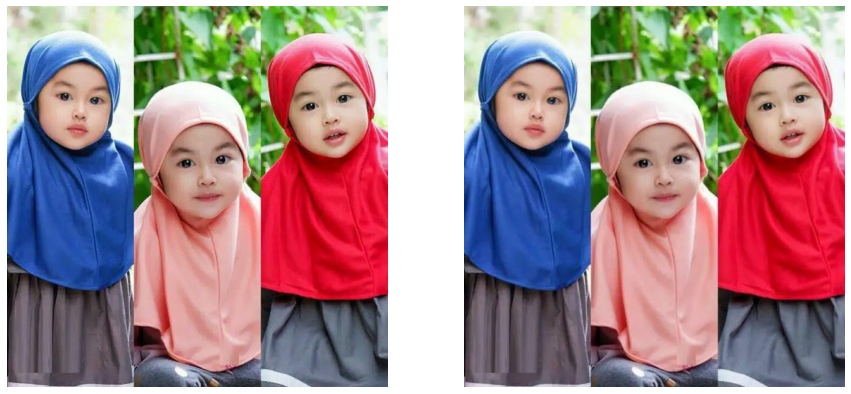

In [54]:
plt.figure(figsize = (15, 10))
for idx, i in enumerate([train_part.loc[997, 'path'], 
                         train_part.loc[520, 'path']]):
    plt.subplot(1, 2, idx + 1)
    image_viz(i)
plt.show()

* An example of a similar, but not identical, image is shown below.

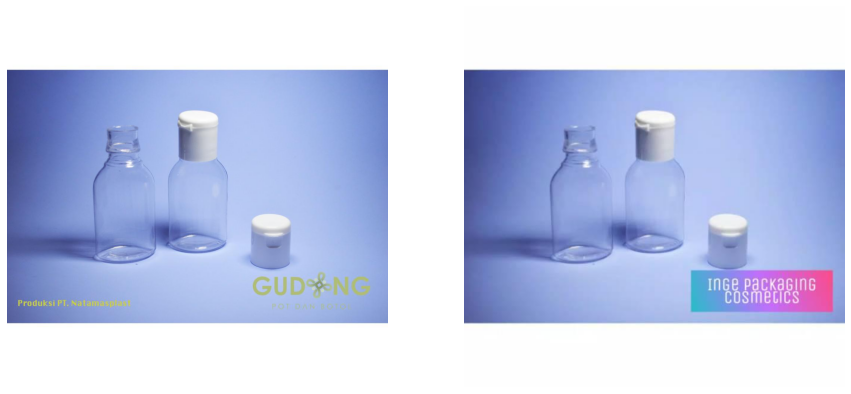

In [55]:
plt.figure(figsize = (15, 10))
for idx, i in enumerate([train_part.loc[55, 'path'], 
                         train_part.loc[312, 'path']]):
    plt.subplot(1, 2, idx + 1)
    image_viz(i)
plt.show()

* An example of a similar, but not identical, image is shown below.

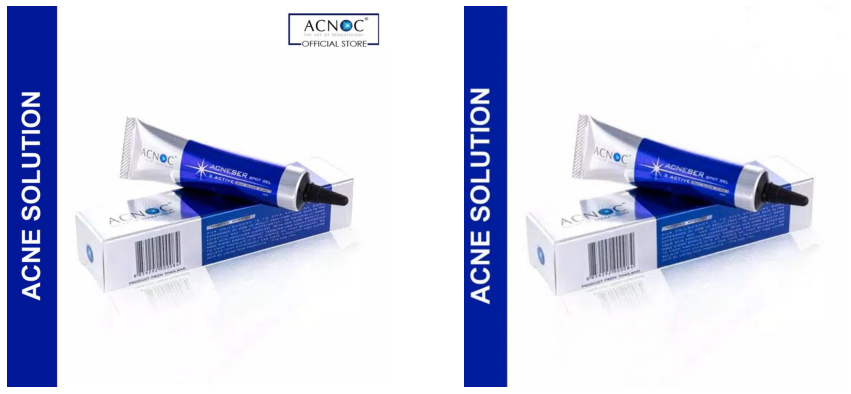

In [56]:
plt.figure(figsize = (15, 10))
for idx, i in enumerate([train_part.loc[128, 'path'], 
                         train_part.loc[515, 'path']]):
    plt.subplot(1, 2, idx + 1)
    image_viz(i)
plt.show()

* An example of a similar, but not identical, image is shown below.

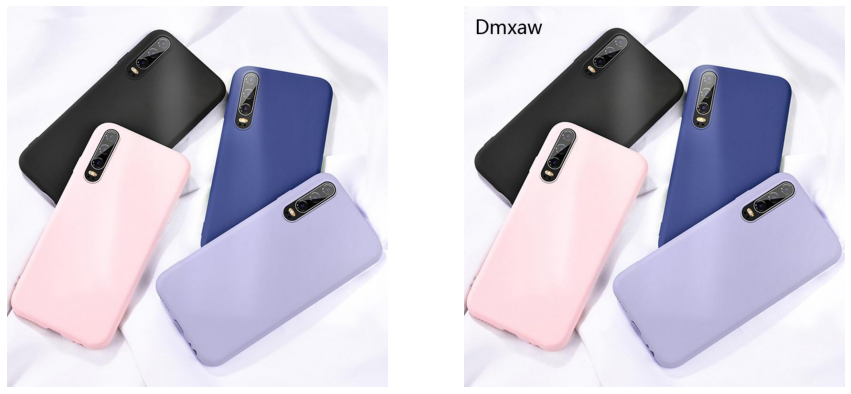

In [57]:
plt.figure(figsize = (15, 10))
for idx, i in enumerate([train_part.loc[216, 'path'], 
                         train_part.loc[567, 'path']]):
    plt.subplot(1, 2, idx + 1)
    image_viz(i)
plt.show()

<h2 style='color:white; background:#000080; border:0'><center>Test Image</center></h2>

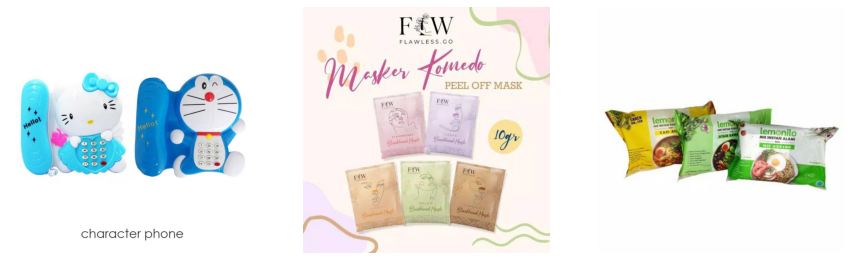

In [58]:
plt.figure(figsize = (15, 10))
for idx, i in enumerate(test['path']):
    plt.subplot(1, 3, idx + 1)
    image_viz(i)
plt.show()

In [59]:
test

,posting_id,image,image_phash,title,path
0,test_2255846744,0006c8e5462ae52167402bac1c2e916e.jpg,ecc292392dc7687a,Edufuntoys - CHARACTER PHONE ada lampu dan mus...,../input/shopee-product-matching//test_images/...
1,test_3588702337,0007585c4d0f932859339129f709bfdc.jpg,e9968f60d2699e2c,(Beli 1 Free Spatula) Masker Komedo | Blackhea...,../input/shopee-product-matching//test_images/...
2,test_4015706929,0008377d3662e83ef44e1881af38b879.jpg,ba81c17e3581cabe,READY Lemonilo Mie instant sehat kuah dan goreng,../input/shopee-product-matching//test_images/...


In [60]:
# coding: utf-8
from tqdm import tqdm
import time

# Set the total value 
bar = tqdm(total = 1000)
# Add description
bar.set_description('Progress rate')
for i in range(100):
    # Set the progress
    bar.update(25)
    time.sleep(1)

Progress rate: : 2500it [01:39, 24.94it/s]

<h2 style='color:white; background:#000080; border:0'><center>Acknowledgements</center></h2>

* [Shopee - Data understanding and analysis](https://www.kaggle.com/isaienkov/shopee-data-understanding-and-analysis)
* [Shopee: Before we start (EDA, PHASH, Baseline)](https://www.kaggle.com/maksymshkliarevskyi/shopee-before-we-start-eda-phash-baseline)
* [EDA of Shopee for starter](https://www.kaggle.com/chumajin/eda-of-shopee-for-starter)
* [Shopee: text prep | FE | image augmentation](https://www.kaggle.com/andradaolteanu/shopee-text-prep-fe-image-augmentation)
* [[V5]Shopee InDepth EDA:One stop for all your needs](https://www.kaggle.com/ishandutta/v5-shopee-indepth-eda-one-stop-for-all-your-needs)
* [[V7]Shopee InDepth EDA:One stop for all your needs](https://www.kaggle.com/ishandutta/v7-shopee-indepth-eda-one-stop-for-all-your-needs)
* [Shopee: Before we start (EDA, PHASH, Baseline)](https://www.kaggle.com/maksymshkliarevskyi/shopee-before-we-start-eda-phash-baseline)
* [RAPIDS cuML TfidfVectorizer and KNN](https://www.kaggle.com/cdeotte/rapids-cuml-tfidfvectorizer-and-knn)

# Work in progress…

# Your upvote is my motivation